# 4DVarNet-FM — L63 Experiments Report

Example trajectory lines and summary metrics for every experiment under `experiments/l63/` (one page of plots per `config/models/*.yaml`), evaluated on the held-out S0 (in-distribution) and S1 (biased/OOD) test sets, alongside the DA baselines (Weak-4DVar, Strong-4DVar, EnKF, ETKF).

In [1]:
%matplotlib inline

In [2]:
import os, sys, io

candidates = [os.getcwd(), os.path.join(os.getcwd(), "reports")]
for c in candidates:
    if os.path.isfile(os.path.join(c, "generate_l63_report.py")):
        REPORTS_DIR = c
        break
else:
    raise RuntimeError(
        "Could not locate reports/generate_l63_report.py -- run this "
        "notebook from the repo root or from reports/."
    )
if REPORTS_DIR not in sys.path:
    sys.path.insert(0, REPORTS_DIR)

import matplotlib.pyplot as plt
from IPython.display import Image, display

import generate_l63_report as gtr

plt.rcParams.update({"font.size": 10, "axes.titlesize": 11, "axes.labelsize": 10})

def show(fig, dpi=140, quality=88):
    """Render a matplotlib figure inline as a JPEG (keeps the notebook file
    small across ~25 figures) and close it."""
    buf = io.BytesIO()
    fig.savefig(buf, format="jpg", dpi=dpi, pil_kwargs={"quality": quality})
    plt.close(fig)
    display(Image(data=buf.getvalue(), format="jpeg"))

print(f"Experiments dir: {gtr.EXP_DIR}")
print(f"Discovered experiments ({len(gtr.EXP_IDS)}): {gtr.EXP_IDS}")

Experiments dir: /home/victornasc/merge/4dvarnet-fm-opencode/experiments/l63
Discovered experiments (11): ['direct_unet', 'joint_cfm', 'joint_direct_unet', 'joint_tweedie_cfm', 'tweedie', 'tweedie_k1', 'vanilla_cfm', 'vanilla_cfm_beta0.5', 'vanilla_cfm_beta0.5_unconditional', 'vanilla_cfm_logit_normal', 'vanilla_cfm_tau0']


## Load configs, results, and loss curves

In [3]:
configs = {eid: gtr.load_config(eid) for eid in gtr.EXP_IDS}
results_by_eid = {eid: gtr.load_results(eid) for eid in gtr.EXP_IDS}

curves_by_case, curves_s2_by_case = {}, {}
for case in gtr.CASES:
    curves, curves_s2 = {}, {}
    for eid in gtr.EXP_IDS:
        c = gtr.load_loss_curve(eid, case, stage=1)
        if c is not None:
            curves[eid] = c
        if gtr.has_stage2(eid, case):
            c2 = gtr.load_loss_curve(eid, case, stage=2)
            if c2 is not None:
                curves_s2[eid] = c2
    curves_by_case[case] = curves
    curves_s2_by_case[case] = curves_s2

baselines_json = gtr.load_baselines_json()
baselines_npz = gtr.load_baselines_npz()

print(f"Configs loaded: {len(configs)} / {len(gtr.EXP_IDS)}")
for eid in gtr.EXP_IDS:
    mt = gtr.model_type_of(eid, configs)
    r = results_by_eid[eid]
    cases_present = [c for c in gtr.CASES if r and c in r] if r else []
    loss_present = [c for c in gtr.CASES if eid in curves_by_case[c]]
    print(f"  {eid:<34} ({gtr.MODEL_LABEL.get(mt, mt):<14}) results: {cases_present}  loss-log: {loss_present}")

if baselines_json is None:
    print(f"\nNo baselines found at {gtr.BASELINES_JSON_PATH} -- baseline overlays will be skipped.")
else:
    for case in gtr.CASES:
        best = gtr.best_baseline_method(baselines_json, case)
        print(f"Best DA baseline for {case}: {best}")

Configs loaded: 11 / 11
  direct_unet                        (DirectUNet    ) results: ['s0', 's1']  loss-log: ['s0', 's1']
  joint_cfm                          (JointCFM      ) results: ['s0', 's1']  loss-log: ['s0', 's1']
  joint_direct_unet                  (JointDirectUNet) results: ['s0', 's1']  loss-log: ['s0', 's1']
  joint_tweedie_cfm                  (JointTweedie  ) results: ['s0', 's1']  loss-log: ['s0', 's1']
  tweedie                            (Tweedie       ) results: ['s0', 's1']  loss-log: ['s0', 's1']
  tweedie_k1                         (Tweedie       ) results: ['s0', 's1']  loss-log: ['s0', 's1']
  vanilla_cfm                        (VanillaCFM    ) results: ['s0', 's1']  loss-log: ['s0', 's1']
  vanilla_cfm_beta0.5                (VanillaCFM    ) results: ['s0', 's1']  loss-log: ['s0', 's1']
  vanilla_cfm_beta0.5_unconditional  (VanillaCFM    ) results: ['s0', 's1']  loss-log: ['s0', 's1']
  vanilla_cfm_logit_normal           (VanillaCFM    ) results: ['s0', 's1']

## Summary metrics (RMSE / R² / CRPS)

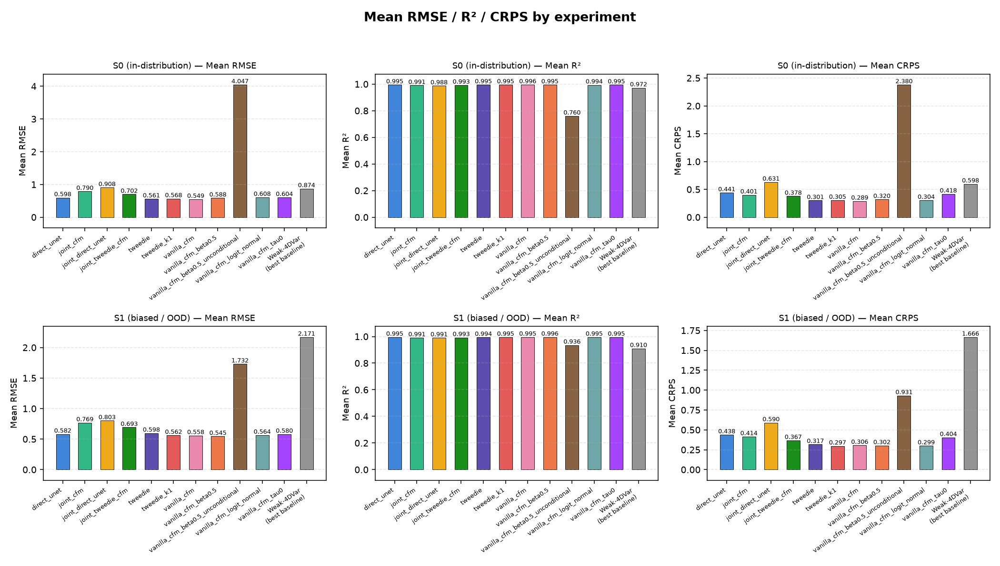

In [4]:
fig = gtr.make_metrics_bar_charts(gtr.display_label, results_by_eid, baselines_json)
show(fig)

## Loss curves

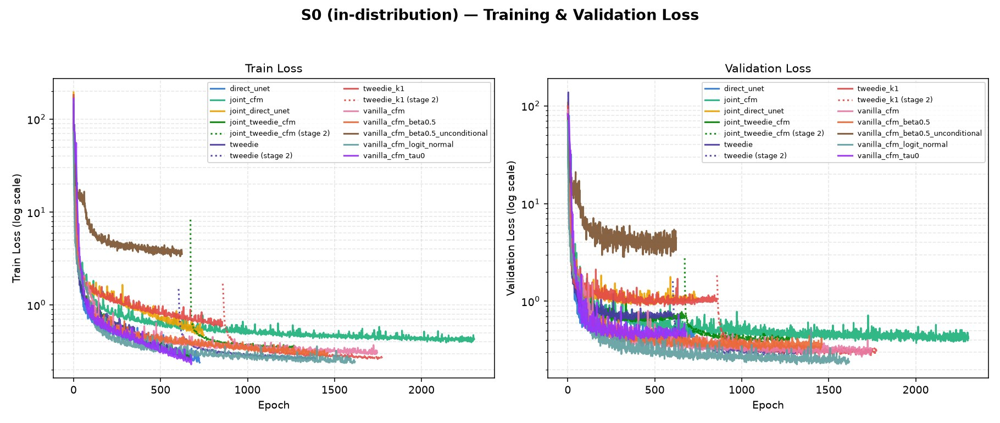

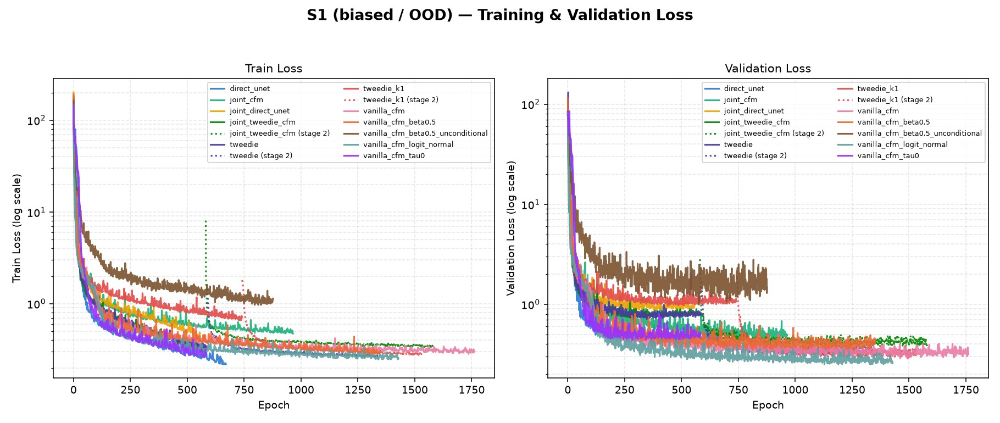

In [5]:
for case in gtr.CASES:
    fig = gtr.make_loss_curves_page(gtr.display_label, curves_by_case[case], curves_s2_by_case[case], case)
    show(fig)

## Trajectory overview — all experiments on one example window

Every model overlaid on the *same* median- and worst-case window (ranked by `direct_unet`'s own per-window RMSE), for a quick at-a-glance comparison before drilling into the per-experiment pages below.

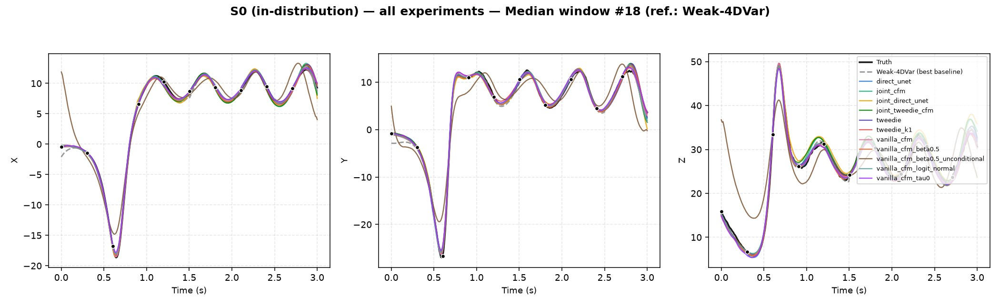

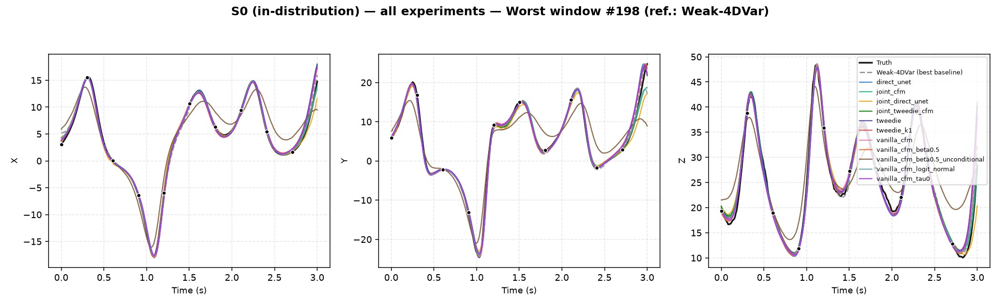

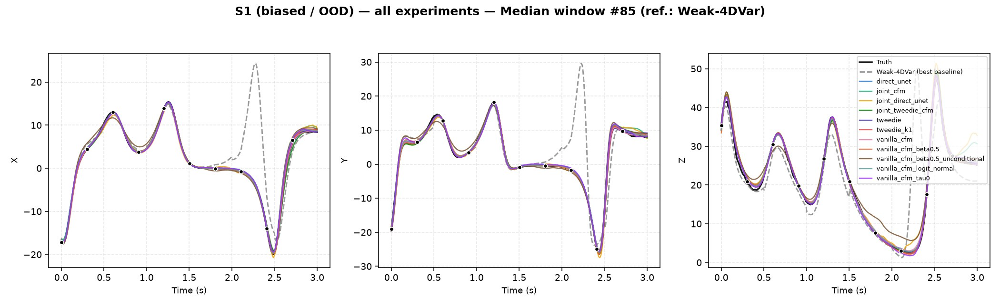

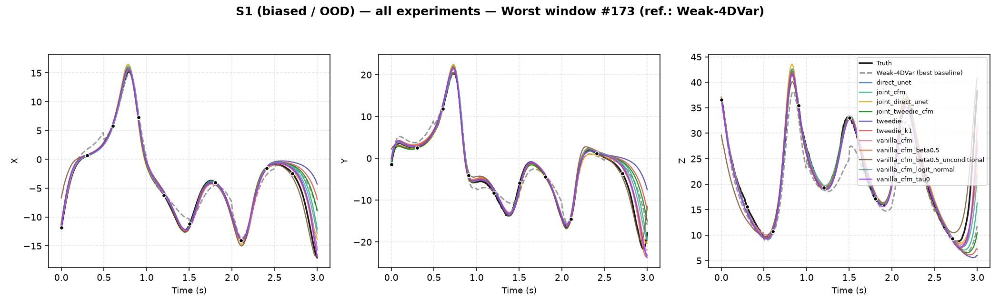

In [6]:
for case in gtr.CASES:
    ref_indices = gtr.reference_indices(case, k=1)
    best = gtr.best_baseline_method(baselines_json, case)
    for tag in ["median", "worst"]:
        idx = int(ref_indices[tag][0])
        fig = gtr.make_overview_trajectory_page(gtr.display_label, case, tag, idx, baselines_npz, best)
        show(fig)

## Per-experiment trajectory detail

Best / median / worst windows (same reference windows as above) for each experiment individually, with an ensemble-spread band (mean ± 1 std across members) for stochastic models, plotted against Truth and the best DA baseline for that case.

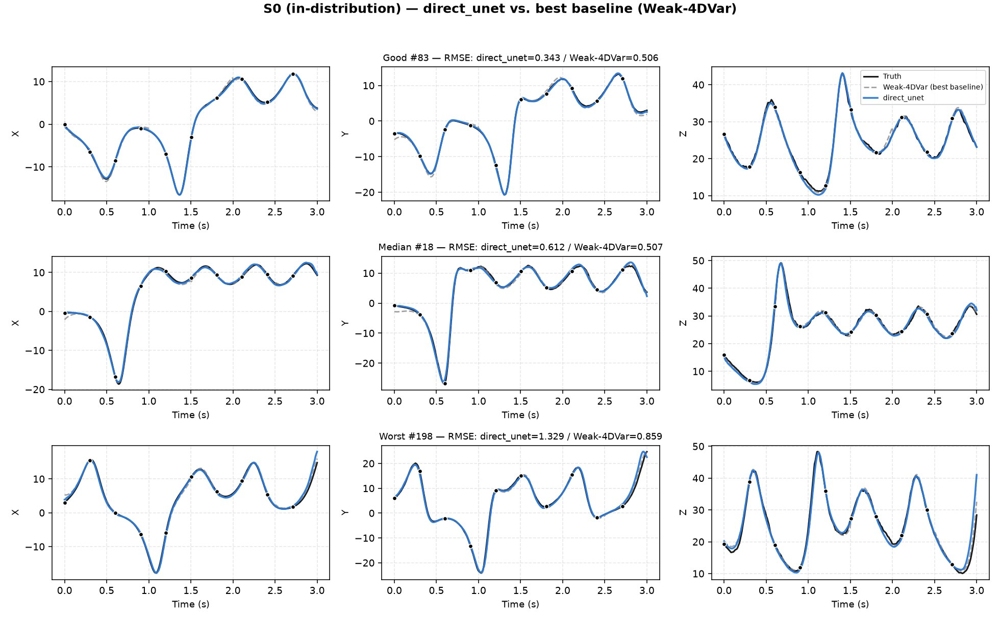

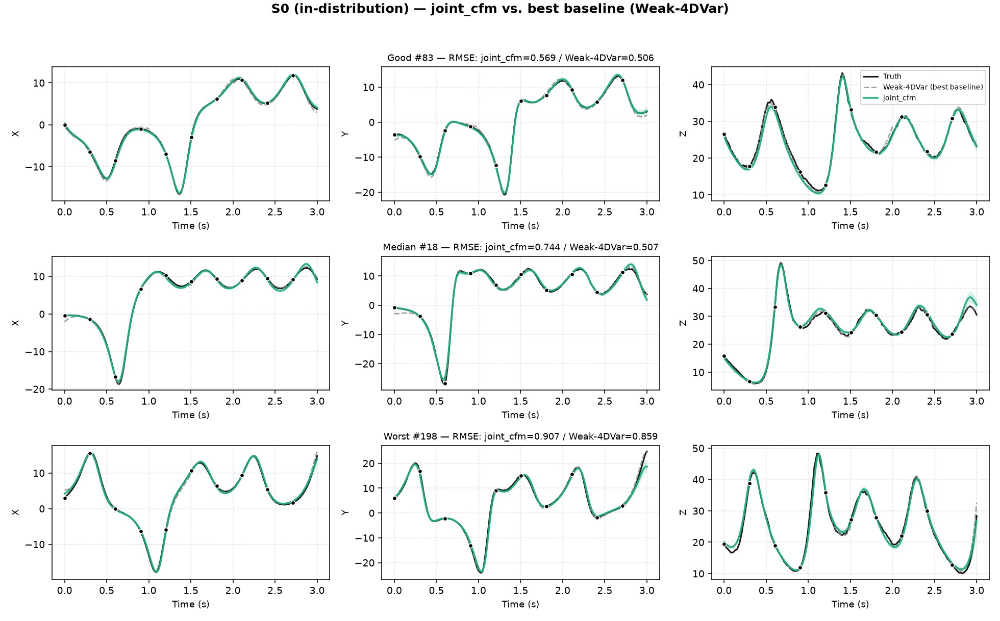

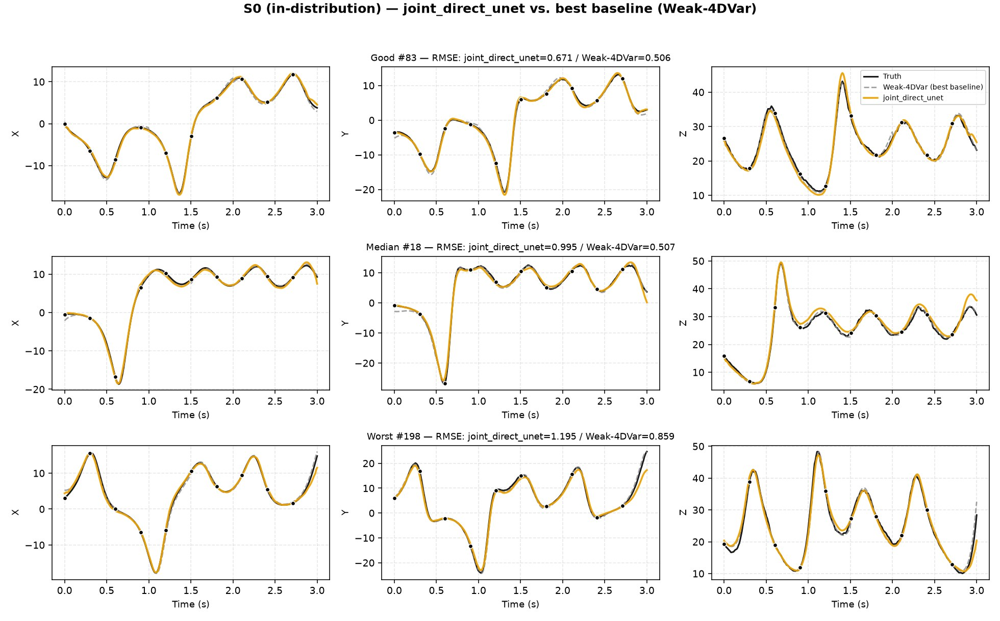

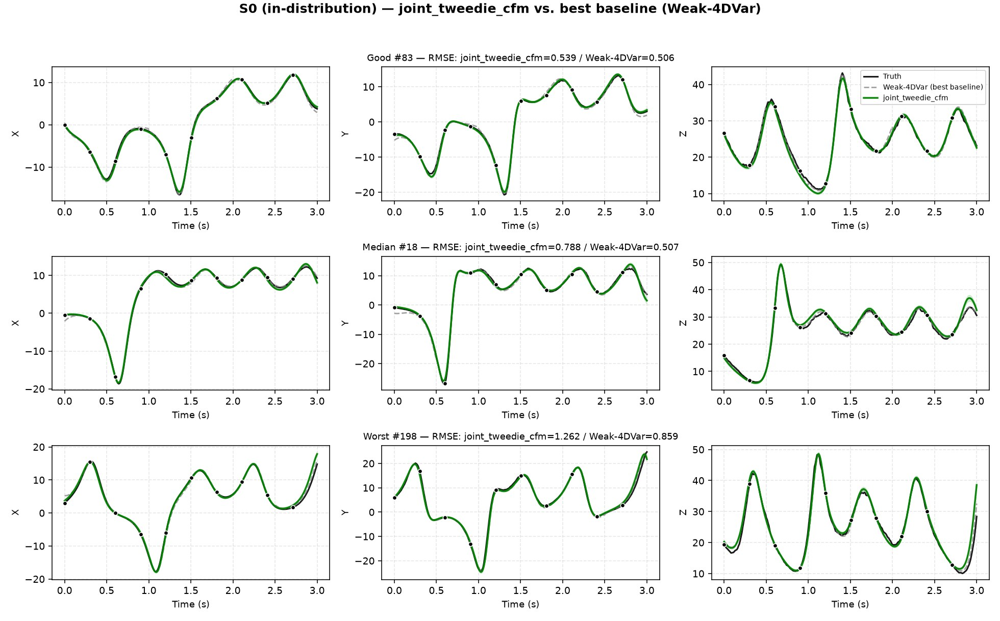

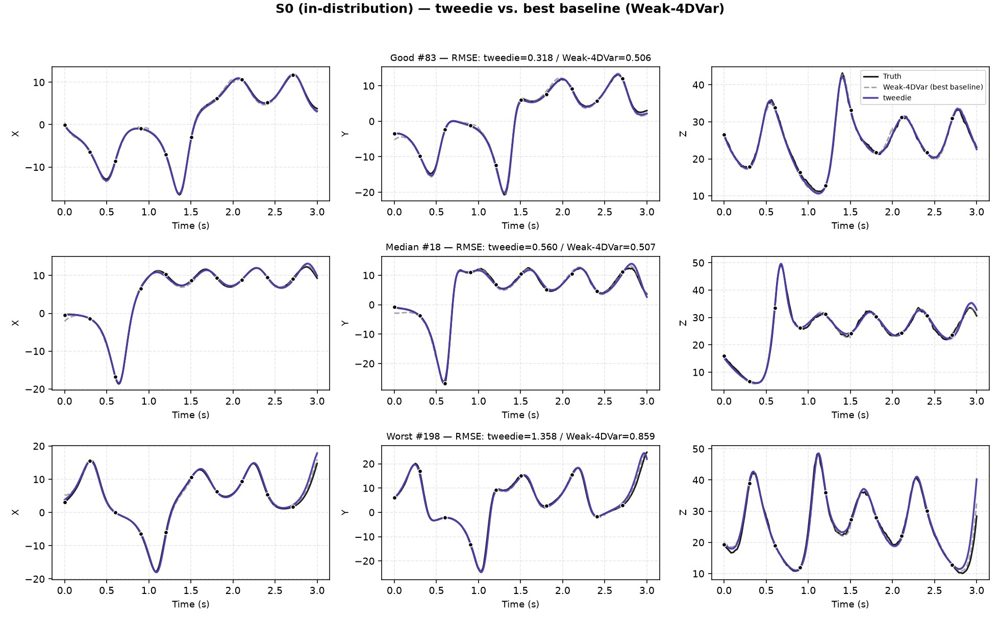

...

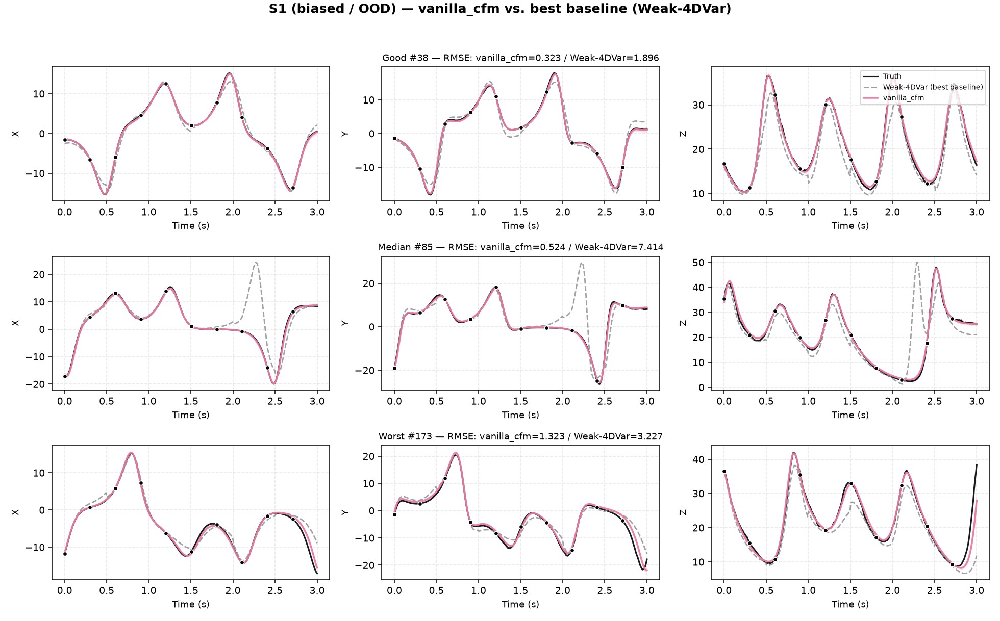

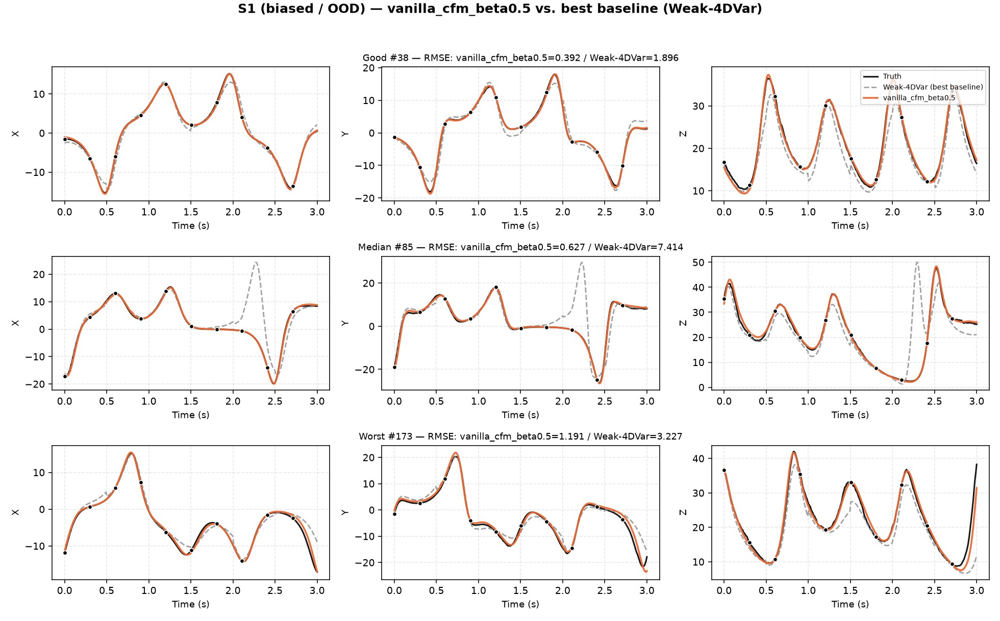

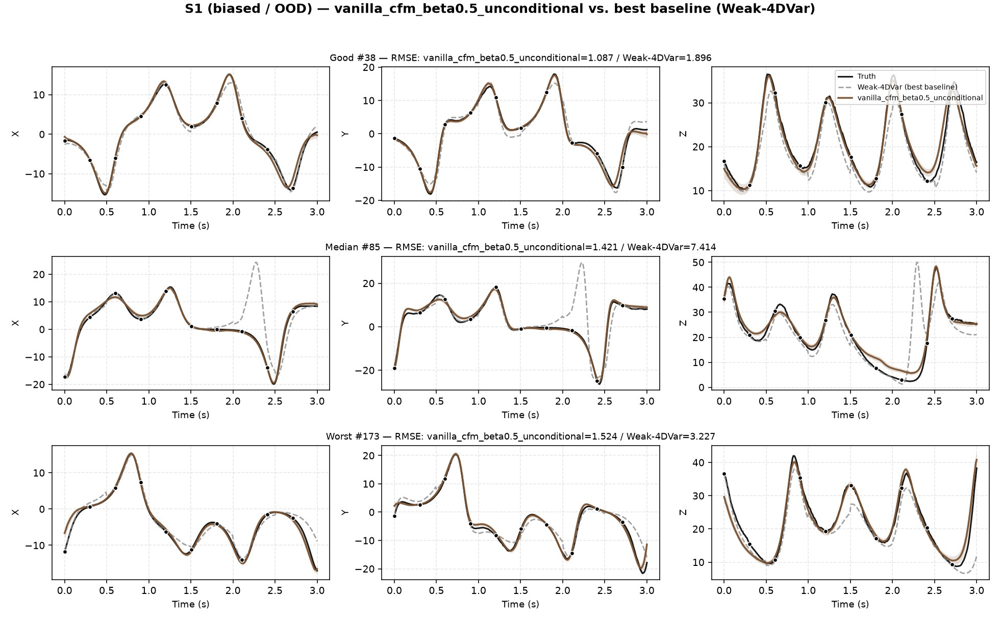

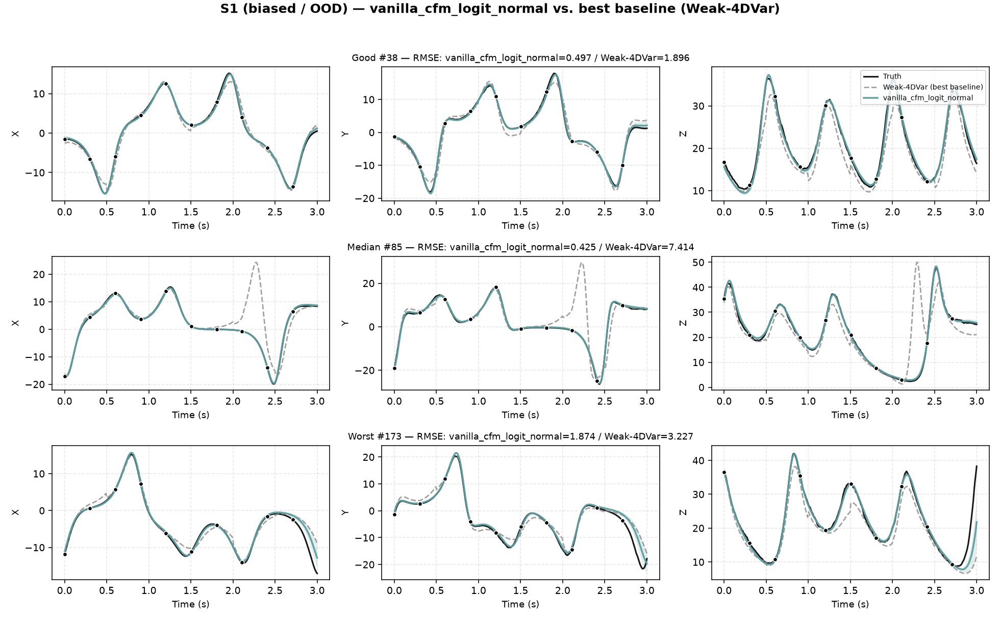

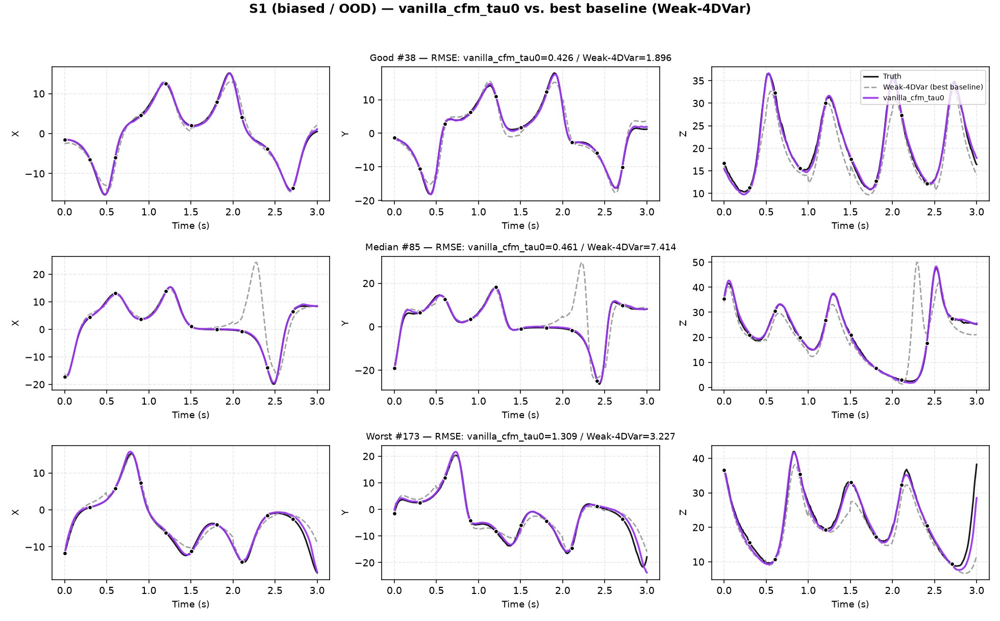

In [7]:
for case in gtr.CASES:
    ref_indices = gtr.reference_indices(case, k=1)
    best = gtr.best_baseline_method(baselines_json, case)
    for eid in gtr.EXP_IDS:
        fig = gtr.make_model_trajectory_page(gtr.display_label, eid, case, ref_indices, baselines_npz, best)
        if fig is not None:
            show(fig)
        else:
            print(f"  (no trajectories for {eid} / {case}, skipped)")